
<br>
<font>
<div dir=ltr align=center>
<font color=0F5298 size=7>
    Machine Learning <br> <br>
<font color=2565AE size=5>
    CE Department <br>
<font color=3C99D size=5>
    Image Colorization<br>
    Image Segmentation<br>
<font color=696880 size=4>



In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/



## Learning Objectives:
By the end of this assignment, students will be able to:
1. Understand and implement Variational Autoencoders for image colorization.
2. Apply the U-Net architecture for image segmentation.
3. Preprocess image datasets, including augmentation techniques.
4. Analyze the performance of machine learning models using relevant metrics.
5. Explore the relationship between latent space and output quality in generative models.


# Image Colorization using VAE
In this section of the assignment, students will explore the fascinating field of image colorization using Variational Autoencoders (VAEs), a type of generative model in deep learning. The task involves transforming grayscale images into colored ones, leveraging the encoder-decoder architecture of VAEs, which are adept at learning complex data distributions. Students will implement and fine-tune an autoencoder network, utilizing components like perceptual loss and feature extraction from pre-trained models, to improve colorization output. By doing so, they will gain a deeper understanding of generative models and their practical applications in computer vision tasks. This exercise offers a hands-on opportunity to blend theoretical knowledge with practical coding skills, characterizing the creative potential of AI in image processing.

Dataset: https://drive.google.com/drive/folders/1KeJbfUykGnPlz0q08_b1IjtW8OxkPdQ9?usp=sharing

## Importing Libraries

In [ ]:
!pip install pytorch_lightning
!pip install seaborn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 819.3/819.3 kB 48.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 926.4/926.4 kB 65.0 MB/s eta 0:00:00


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sea
from tqdm.notebook import tqdm
import os
import torch
import torch.nn as nn
import pytorch_lightning as pl
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import torch.nn.functional as F
import torchmetrics
from torchmetrics import Metric
import torchvision
import math
print(plt.style.available)
plt.style.use('seaborn-v0_8')
device = 'cuda' if torch.cuda.is_available() else 'cpu'

np.__version__, device

['Solarize_Light2', '_classic_test_patch', '_mpl-gallery', '_mpl-gallery-nogrid', 'bmh', 'classic', 'dark_background', 'fast', 'fivethirtyeight', 'ggplot', 'grayscale', 'seaborn-v0_8', 'seaborn-v0_8-bright', 'seaborn-v0_8-colorblind', 'seaborn-v0_8-dark', 'seaborn-v0_8-dark-palette', 'seaborn-v0_8-darkgrid', 'seaborn-v0_8-deep', 'seaborn-v0_8-muted', 'seaborn-v0_8-notebook', 'seaborn-v0_8-paper', 'seaborn-v0_8-pastel', 'seaborn-v0_8-poster', 'seaborn-v0_8-talk', 'seaborn-v0_8-ticks', 'seaborn-v0_8-white', 'seaborn-v0_8-whitegrid', 'tableau-colorblind10']


('1.26.4', 'cuda')

## Loading the Data

In [ ]:
import os
import pandas as pd
from tqdm import tqdm
from sklearn.utils import shuffle

train_dir = "/content/drive/MyDrive/ML/train"
test_dir = "/content/drive/MyDrive/ML/test"
valid_dir = "/content/drive/MyDrive/ML/valid"

def load_data(PATH):
    filenames = []
    outcomes = []

    for folder in tqdm(os.listdir(PATH), desc='Loading Data'):
      folder_path = os.path.join(PATH, folder)
      if os.path.isdir(folder_path):
        for file in os.listdir(folder_path):
          filenames.append(os.path.join(folder, file))
          outcomes.append(folder)

    df = pd.DataFrame({"filename": filenames, "outcome": outcomes})
    return shuffle(df, random_state=42)

train_data = load_data("/content/drive/MyDrive/ML/train")
valid_data = load_data("/content/drive/MyDrive/ML/valid")
test_data = load_data("/content/drive/MyDrive/ML/test")

print(f'\n\n train shape: {train_data.shape}')
print(f'validation shape: {valid_data.shape}')
print(f'test shape: {test_data.shape}')

Loading Data: 100%|██████████| 20/20 [00:02<00:00,  7.37it/s]



 train shape: (3208, 2)
validation shape: (100, 2)
test shape: (100, 2)


In [ ]:
# TODO: Combine the training and test data into a single DataFrame along the vertical axis
combined_data = pd.concat([train_data, test_data], axis=0)

In [ ]:
# TODO: Explore the new DataFrame
combined_data

,filename,outcome
610,ALPINE CHOUGH/010.jpg,ALPINE CHOUGH
3051,ABYSSINIAN GROUND HORNBILL/114.jpg,ABYSSINIAN GROUND HORNBILL
2905,ABYSSINIAN GROUND HORNBILL/077.jpg,ABYSSINIAN GROUND HORNBILL
2891,ABYSSINIAN GROUND HORNBILL/020.jpg,ABYSSINIAN GROUND HORNBILL
2886,ABYSSINIAN GROUND HORNBILL/003.jpg,ABYSSINIAN GROUND HORNBILL
...,...,...
60,ALBATROSS/4.jpg,ALBATROSS
71,AFRICAN FIREFINCH/3.jpg,AFRICAN FIREFINCH
14,AMERICAN COOT/5.jpg,AMERICAN COOT
92,AFRICAN OYSTER CATCHER/5.jpg,AFRICAN OYSTER CATCHER


## Plot some of the images

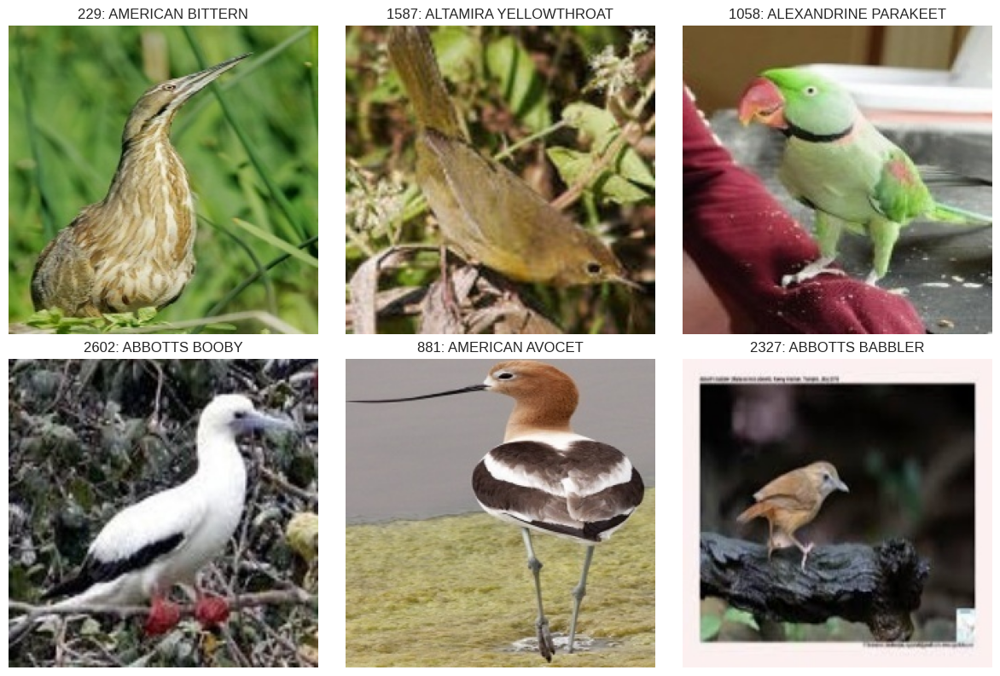

In [ ]:
from PIL import Image
num_images = 6
sample_df = combined_data.sample(num_images, random_state=42)
cols = math.ceil(math.sqrt(num_images))
rows = math.ceil(num_images / cols)

fig, axes = plt.subplots(rows, cols, figsize=(cols * 4, rows * 4))
axes = axes.flatten()

for i, (idx, row) in enumerate(sample_df.iterrows()):
    image_path = os.path.join("/content/drive/MyDrive/ML/train", row['filename'])
    image = Image.open(image_path)


    axes[i].imshow(image)
    axes[i].set_title(f"{idx}: {row['outcome']}")
    axes[i].axis('off')

for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

## Dataset Distribution
plot the distribution of the dataset, both training and validation set

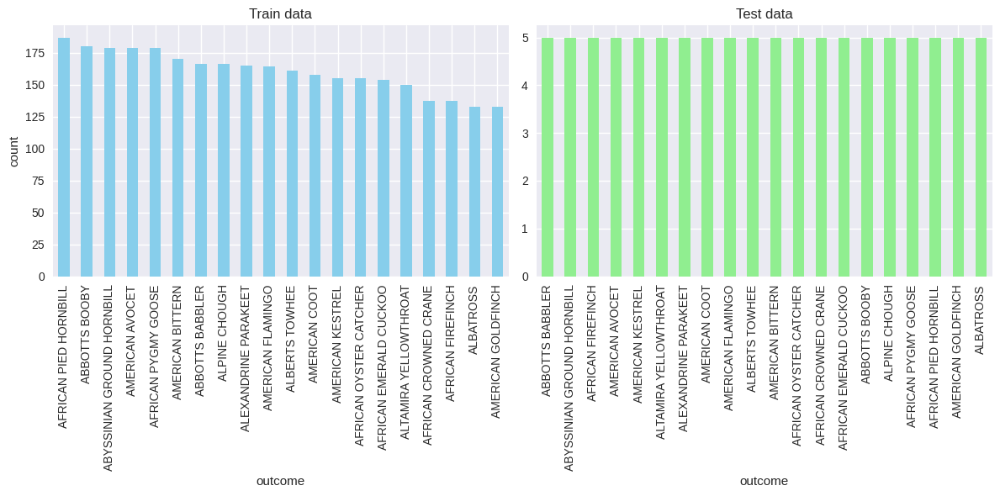

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

train_data['outcome'].value_counts().plot(kind='bar', ax=ax1, color='skyblue')
ax1.set_title('Train data')
ax1.set_xlabel('outcome')
ax1.set_ylabel('count')

# Test data plot
test_data['outcome'].value_counts().plot(kind='bar', ax=ax2, color='lightgreen')
ax2.set_title('Test data')
ax2.set_xlabel('outcome')

plt.tight_layout()
plt.show()


## Dataset Preparation
Now we are going to build the dataset by using `Dataset` and `DataLoader` classes within PyTorch. I recommend you to randomly crop the images to (160, 160) and then normalize them.

In [ ]:
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
import cv2
import matplotlib.pyplot as plt

class BirdDataset(Dataset):
    def __init__(self, df, img_path, input_transform=None, target_transform=None):
        self.df = df
        self.input_transform = input_transform
        self.target_transform = target_transform
        self.img_path = img_path
    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        img_name = self.df.iloc[idx]['filename']
        img_p = os.path.join(self.img_path, img_name)
        img = plt.imread(img_p)

        grayscale_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        grayscale_img = Image.fromarray(grayscale_img)
        rgb_img = Image.fromarray(img)

        gray_image = self.input_transform(grayscale_img) if self.input_transform else grayscale_img
        rgb_image = self.target_transform(rgb_img) if self.target_transform else rgb_img

        return gray_image, rgb_image

input_transforms = transforms.Compose([
    transforms.Resize((160, 160)),
    transforms.ToTensor()
])

target_label_transform = transforms.Compose([
    transforms.Resize((160, 160)),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    transforms.ToTensor()
])

train_dataset = BirdDataset(
    df=train_data,
    img_path = train_dir,
    input_transform=input_transforms,
    target_transform=target_label_transform
)

valid_dataset = BirdDataset(
    df=valid_data,
    img_path=valid_dir,
    input_transform=input_transforms,
    target_transform=target_label_transform
)

test_dataset = BirdDataset(
    df=test_data,
    img_path=test_dir,
    input_transform=input_transforms,
    target_transform=target_label_transform
)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
valid_loader = DataLoader(valid_dataset, batch_size=32, shuffle=False)

print(f"Len training samples: {len(train_dataset)}")
print(f"Len validation samples: {len(valid_dataset)}")


Len training samples: 3208
Len validation samples: 100


**Why is data augmentation pivotal in training models for image tasks, and what techniques are beneficial for this particular assignment?**
Increases Training Data Diversity: By applying transformations like cropping, normalizing, or color jittering, data augmentation expands the variety of images in the training set. This helps the model generalize better to new, unseen data.

Prevents Overfitting: When a model overfits, it memorizes the training data instead of learning generalizable patterns. Augmentation exposes the model to different variations of the same data, which helps mitigate overfitting and improves its ability to generalize.

Enhances Small Datasets: For small datasets, data augmentation can effectively generate additional diverse samples. This allows the model to learn more robust features and improves overall performance.

## Model Architecture
The model has an encoder block for encoding the grayscale image into a lower representation followed by a decoder block to generate the colorized image.

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torchvision import models
from tqdm import tqdm

class PerceptualLoss(nn.Module):
    def __init__(self, feature_layers=None, use_half=False):
        super(PerceptualLoss, self).__init__()
        vgg = models.vgg19(pretrained=True).features
        self.layers = nn.ModuleList([vgg[i] for i in range(max(feature_layers or [0, 5, 10, 19, 28]) + 1)])

        for param in self.parameters():
            param.requires_grad = False

        self.feature_layers = feature_layers or [0, 5, 10, 19, 28]
        self.use_half = use_half

    def forward(self, x, y):
        if self.use_half:
            x, y = x.half(), y.half()

        mean = torch.tensor([0.485, 0.456, 0.406], device=x.device).view(1, 3, 1, 1)
        std = torch.tensor([0.229, 0.224, 0.225], device=x.device).view(1, 3, 1, 1)

        x = (x - mean) / std
        y = (y - mean) / std

        loss = 0
        for i, layer in enumerate(self.layers):
            x, y = layer(x), layer(y)
            if i in self.feature_layers:
                loss += F.l1_loss(x, y)

        return loss

class Encoder(nn.Module):
    def __init__(self, do_bn=False, latent_dim=128):
        super(Encoder, self).__init__()
        self.block1 = self._make_block(1, 64, do_bn)
        self.block2 = self._make_block(64, 128, do_bn)
        self.block3 = self._make_block(128, 256, do_bn)
        self.block4 = self._make_block(256, 512, do_bn)

        self.fc_mu = nn.Linear(512 * 10 * 10, latent_dim)
        self.fc_logvar = nn.Linear(512 * 10 * 10, latent_dim)

    @staticmethod
    def _make_block(in_channels, out_channels, do_bn, pool_size=2):
        layers = [nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1)]
        if do_bn:
            layers.append(nn.BatchNorm2d(out_channels))
        layers += [nn.ReLU(inplace=True), nn.MaxPool2d(kernel_size=pool_size)]
        return nn.Sequential(*layers)

    def forward(self, x):
        h = self.block1(x)
        h = self.block2(h)
        h = self.block3(h)
        h = self.block4(h)
        h = h.view(h.size(0), -1)
        return self.fc_mu(h), self.fc_logvar(h)

class Decoder(nn.Module):
    def __init__(self, do_bn=False, latent_dim=128):
        super(Decoder, self).__init__()
        self.fc = nn.Linear(latent_dim, 512 * 10 * 10)
        self.up1 = self._make_block(512, 256, do_bn)
        self.up2 = self._make_block(256, 128, do_bn)
        self.up3 = self._make_block(128, 64, do_bn)
        self.up4 = self._make_block(64, 32, do_bn)
        self.final_conv = nn.Conv2d(32, 3, kernel_size=3, padding=1)

    @staticmethod
    def _make_block(in_channels, out_channels, do_bn):
        layers = [nn.ConvTranspose2d(in_channels, out_channels, kernel_size=2, stride=2)]
        if do_bn:
            layers.append(nn.BatchNorm2d(out_channels))
        layers.append(nn.ReLU(inplace=True))
        return nn.Sequential(*layers)

    def forward(self, z):
        h = self.fc(z).view(z.size(0), 512, 10, 10)
        h = self.up1(h)
        h = self.up2(h)
        h = self.up3(h)
        h = self.up4(h)
        return torch.sigmoid(self.final_conv(h))

class Net(nn.Module):
    def __init__(self, latent_dim=512, lr=1e-4, do_bn=False, use_perceptual_loss=False):
        super(Net, self).__init__()
        self.encoder = Encoder(do_bn=do_bn, latent_dim=latent_dim)
        self.decoder = Decoder(do_bn=do_bn, latent_dim=latent_dim)
        self.optim = optim.Adam(self.parameters(), lr=lr)
        self.use_perceptual_loss = use_perceptual_loss

        if use_perceptual_loss:
            self.perceptual_loss = PerceptualLoss(feature_layers=[0, 5, 10, 19, 28])

    @staticmethod
    def reparameterize(mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def forward(self, x):
        mu, logvar = self.encoder(x)
        z = self.reparameterize(mu, logvar)
        return self.decoder(z), mu, logvar

    def compute_loss(self, pred, target, mu, logvar):
        recon_loss = F.mse_loss(pred, target)

        if self.use_perceptual_loss:
            recon_loss += 0.01 * self.perceptual_loss(pred, target)

        kld_loss = -0.5 * torch.mean(1 + logvar - mu.pow(2) - logvar.exp())
        return recon_loss + 0.001 * kld_loss, recon_loss, kld_loss

    def training_step(self, batch):
        images, labels = [x.to(next(self.parameters()).device) for x in batch]
        pred, mu, logvar = self.forward(images)
        loss, recon_loss, kld_loss = self.compute_loss(pred, labels, mu, logvar)

        self.optim.zero_grad()
        loss.backward()
        self.optim.step()

        return loss.item(), recon_loss.item(), kld_loss.item()

    def validation_step(self, batch):
        with torch.no_grad():
            images, labels = [x.to(next(self.parameters()).device) for x in batch]
            pred, mu, logvar = self.forward(images)
            loss, recon_loss, kld_loss = self.compute_loss(pred, labels, mu, logvar)
        return loss.item(), recon_loss.item(), kld_loss.item()

    def train_model(self, train_loader, val_loader, epochs=10, device='cuda'):
        self.to(device)
        train_losses, val_losses = [], []
        scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(self.optim, mode='min', factor=0.1, patience=5, verbose=True)

        for epoch in range(epochs):
            self.train()
            train_epoch_losses = [self.training_step(batch) for batch in tqdm(train_loader, desc=f"Epoch {epoch + 1}/{epochs} [Train]")]

            self.eval()
            val_epoch_losses = [self.validation_step(batch) for batch in tqdm(val_loader, desc=f"Epoch {epoch + 1}/{epochs} [Val]")]

            train_loss_avg = torch.tensor([x[0] for x in train_epoch_losses]).mean().item()
            val_loss_avg = torch.tensor([x[0] for x in val_epoch_losses]).mean().item()

            scheduler.step(val_loss_avg)

            print(f"Epoch {epoch + 1}/{epochs}: Train Loss: {train_loss_avg:.4f}, Val Loss: {val_loss_avg:.4f}")
            train_losses.append(train_loss_avg)
            val_losses.append(val_loss_avg)

        return train_losses, val_losses


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)
model = Net()
print(model)


cuda
Net(
  (encoder): Encoder(
    (block1): Sequential(
      (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    )
    (block2): Sequential(
      (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    )
    (block3): Sequential(
      (0): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    )
    (block4): Sequential(
      (0): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    )
    (fc_mu): Linear(in_features=51200, out_features=512, bias=Tr

## Training Phase

In [ ]:
model = Net().to(device)
history = model.train_model(train_loader=train_loader, val_loader=valid_loader, epochs=30)

Epoch 1/30 [Val]: 100%|██████████| 4/4 [01:15<00:00, 18.81s/it]


Epoch 1/30: Train Loss: 0.0589, Val Loss: 0.0484


Epoch 2/30 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.92it/s]


Epoch 2/30: Train Loss: 0.0448, Val Loss: 0.0469


Epoch 3/30 [Val]: 100%|██████████| 4/4 [00:01<00:00,  3.68it/s]


Epoch 3/30: Train Loss: 0.0408, Val Loss: 0.0359


Epoch 4/30 [Val]: 100%|██████████| 4/4 [00:01<00:00,  3.03it/s]


Epoch 4/30: Train Loss: 0.0363, Val Loss: 0.0325


Epoch 5/30 [Val]: 100%|██████████| 4/4 [00:01<00:00,  3.67it/s]


Epoch 5/30: Train Loss: 0.0309, Val Loss: 0.0321


Epoch 6/30 [Val]: 100%|██████████| 4/4 [00:01<00:00,  3.72it/s]


Epoch 6/30: Train Loss: 0.0296, Val Loss: 0.0323


Epoch 7/30 [Val]: 100%|██████████| 4/4 [00:01<00:00,  3.66it/s]


Epoch 7/30: Train Loss: 0.0284, Val Loss: 0.0268


Epoch 8/30 [Val]: 100%|██████████| 4/4 [00:01<00:00,  3.72it/s]


Epoch 8/30: Train Loss: 0.0274, Val Loss: 0.0274


Epoch 9/30 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.92it/s]


Epoch 9/30: Train Loss: 0.0269, Val Loss: 0.0279


Epoch 10/30 [Val]: 100%|██████████| 4/4 [00:01<00:00,  3.69it/s]


Epoch 10/30: Train Loss: 0.0264, Val Loss: 0.0275


Epoch 11/30 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.96it/s]


Epoch 11/30: Train Loss: 0.0258, Val Loss: 0.0264


Epoch 12/30 [Val]: 100%|██████████| 4/4 [00:01<00:00,  3.68it/s]


Epoch 12/30: Train Loss: 0.0258, Val Loss: 0.0274


Epoch 13/30 [Val]: 100%|██████████| 4/4 [00:01<00:00,  3.36it/s]


Epoch 13/30: Train Loss: 0.0250, Val Loss: 0.0252


Epoch 14/30 [Val]: 100%|██████████| 4/4 [00:01<00:00,  3.76it/s]


Epoch 14/30: Train Loss: 0.0246, Val Loss: 0.0258


Epoch 15/30 [Val]: 100%|██████████| 4/4 [00:01<00:00,  3.67it/s]


Epoch 15/30: Train Loss: 0.0246, Val Loss: 0.0288


Epoch 16/30 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.98it/s]


Epoch 16/30: Train Loss: 0.0240, Val Loss: 0.0249


Epoch 17/30 [Val]: 100%|██████████| 4/4 [00:01<00:00,  3.71it/s]


Epoch 17/30: Train Loss: 0.0237, Val Loss: 0.0263


Epoch 18/30 [Val]: 100%|██████████| 4/4 [00:01<00:00,  3.73it/s]


Epoch 18/30: Train Loss: 0.0233, Val Loss: 0.0242


Epoch 19/30 [Val]: 100%|██████████| 4/4 [00:01<00:00,  3.64it/s]


Epoch 19/30: Train Loss: 0.0230, Val Loss: 0.0261


Epoch 20/30 [Val]: 100%|██████████| 4/4 [00:01<00:00,  3.73it/s]


Epoch 20/30: Train Loss: 0.0230, Val Loss: 0.0254


Epoch 21/30 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.94it/s]


Epoch 21/30: Train Loss: 0.0224, Val Loss: 0.0218


Epoch 22/30 [Val]: 100%|██████████| 4/4 [00:01<00:00,  3.72it/s]


Epoch 22/30: Train Loss: 0.0223, Val Loss: 0.0222


Epoch 23/30 [Val]: 100%|██████████| 4/4 [00:01<00:00,  3.14it/s]


Epoch 23/30: Train Loss: 0.0222, Val Loss: 0.0243


Epoch 24/30 [Val]: 100%|██████████| 4/4 [00:01<00:00,  3.73it/s]


Epoch 24/30: Train Loss: 0.0218, Val Loss: 0.0228


Epoch 25/30 [Val]: 100%|██████████| 4/4 [00:01<00:00,  3.74it/s]


Epoch 25/30: Train Loss: 0.0213, Val Loss: 0.0224


Epoch 26/30 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.96it/s]


Epoch 26/30: Train Loss: 0.0208, Val Loss: 0.0248


Epoch 27/30 [Val]: 100%|██████████| 4/4 [00:01<00:00,  3.67it/s]


Epoch 27/30: Train Loss: 0.0207, Val Loss: 0.0250


Epoch 28/30 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.95it/s]


Epoch 28/30: Train Loss: 0.0199, Val Loss: 0.0248


Epoch 29/30 [Val]: 100%|██████████| 4/4 [00:01<00:00,  3.50it/s]


Epoch 29/30: Train Loss: 0.0200, Val Loss: 0.0238


Epoch 30/30 [Val]: 100%|██████████| 4/4 [00:01<00:00,  3.73it/s]

Epoch 30/30: Train Loss: 0.0196, Val Loss: 0.0236


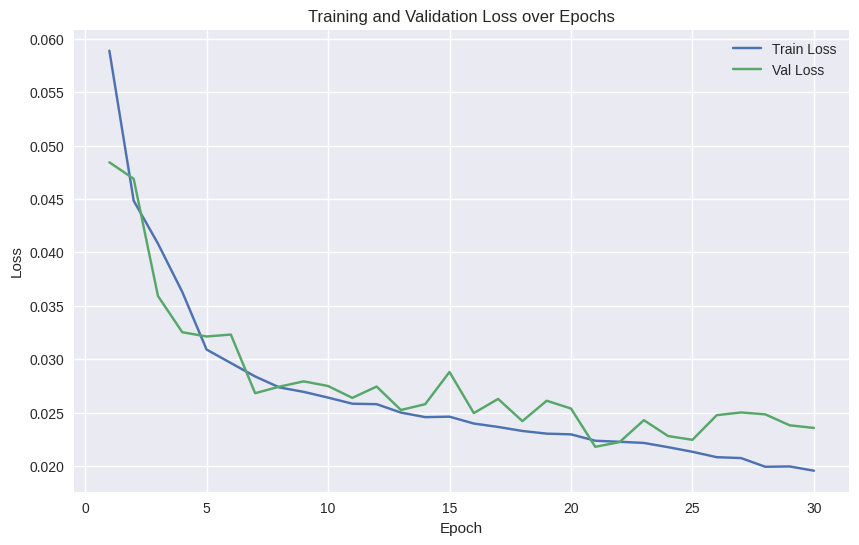

In [ ]:
def plot_loss(train_loss, val_loss, epochs):
    import matplotlib.pyplot as plt

    plt.figure(figsize=(10, 6))
    plt.plot(range(1, epochs + 1), train_loss, label='Train Loss')
    plt.plot(range(1, epochs + 1), val_loss, label='Val Loss')
    plt.title("Training and Validation Loss over Epochs")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend()
    plt.grid(True)
    plt.show()
plot_loss(history[0],history[1],30)

In [ ]:
torch.save(model, '/content/drive/MyDrive/ML/P1.pth')

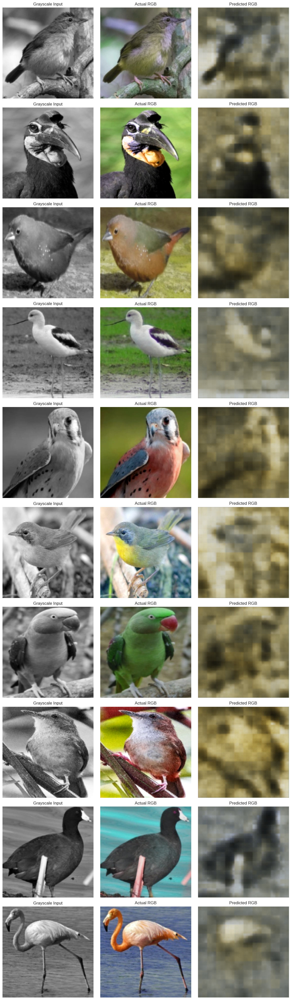

In [ ]:
def visualize_samples(dataset, model, device, num_samples=3):
    import matplotlib.pyplot as plt

    fig, axes = plt.subplots(num_samples, 3, figsize=(12, 4 * num_samples))

    for i in range(num_samples):
        gray_image, rgb_image = dataset[i]


        gray_image_np = gray_image.squeeze(0).numpy()
        rgb_image_np = rgb_image.permute(1, 2, 0).numpy()


        axes[i, 0].imshow(gray_image_np, cmap='gray')
        axes[i, 0].set_title('Grayscale Input')
        axes[i, 0].axis('off')


        axes[i, 1].imshow(rgb_image_np)
        axes[i, 1].set_title('Actual RGB')
        axes[i, 1].axis('off')


        gray_image = gray_image.unsqueeze(0).to(device)
        model.eval()
        with torch.no_grad():
            pred, _, _ = model(gray_image)
        pred_np = pred[0].permute(1, 2, 0).cpu().numpy()

        axes[i, 2].imshow(pred_np)
        axes[i, 2].set_title('Predicted RGB')
        axes[i, 2].axis('off')

    plt.tight_layout()
    plt.show()

visualize_samples(test_dataset, model, device, num_samples=10)


['I', 'O', 'S', 'U', 'H', 'R', 'D', 'F', 'N', 'A', 'B', ' ', 'K', 'X', 'Y', 'G', 'P', 'L', 'E', 'V', 'C', 'T', 'M', 'W']


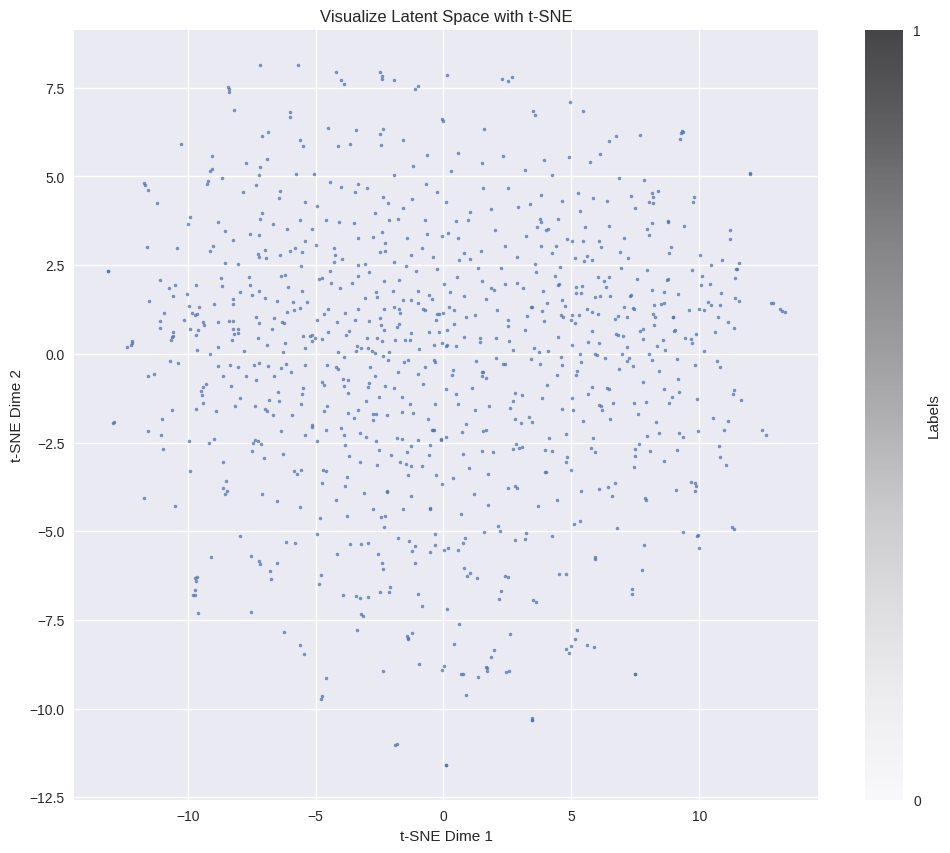

In [ ]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import torch

def visualize_latent_space(encoder, data_loader, num_samples=1000, device='cuda'):
    encoder.eval()
    latent_vectors = []
    labels = []

    with torch.no_grad():
        for idx, (images, label_batch) in enumerate(data_loader):
            if len(latent_vectors) >= num_samples:
                break
            images = images.to(device)
            mu, _ = encoder(images)
            latent_vectors.append(mu.cpu())
            labels.extend(train_dataset.df.iloc[idx, 1])
        latent_vectors = np.vstack(latent_vectors)
        labels = list(set(labels))
        tsne = TSNE(n_components=2, random_state=42)
        latent_2d = tsne.fit_transform(latent_vectors)
        print(labels)
        plt.figure(figsize=(12, 10))
        scatter = plt.scatter(latent_2d[:, 0], latent_2d[:, 1], s=5, alpha=0.7)
        plt.colorbar(scatter, ticks=range(len(labels)), label="Labels")
        plt.title('Visualize Latent Space with t-SNE')
        plt.xlabel('t-SNE Dime 1')
        plt.ylabel('t-SNE Dime 2')
        plt.show()

visualize_latent_space(model.encoder, data_loader=train_loader, num_samples=30)

How the distribution of points in the latent space reflects the VAE's capability to generalize grayscale images into colored outputs.

1. **Clustering and Class Representation**:
    - Can you identify clusters in the latent space that correspond to specific image features or categories?
    - How do these clusters inform us about the VAE's ability to differentiate between various input characteristics related to color information?
    Answer: Clusters in the latent space typically represent shared features (e.g., textures, shapes) or distinct categories (e.g., sky, vegetation). Clear clustering suggests that the VAE effectively captures color-related features, improving its ability to generate accurate and distinct colorizations for different inputs.

2. **Continuity and Transitions**:
    - Analyze whether neighboring points in the latent space result in similar or different color outputs. What does this continuity suggest about the latent representation's smoothness?
    - How could these visual transitions impact the quality and realism of the generated colorations, especially for input images that exhibit gradual changes (e.g., transitions in lighting or shading)?
    Answer: Neighboring points in the latent space usually produce similar outputs, indicating a smooth latent representation. These smooth transitions enable realistic color variations, effectively handling gradual changes in input, such as lighting or shading, and enhancing the quality and coherence of the colorized outputs.

3. **Effectiveness of Dimensionality Reduction**:
    - Assess the effectiveness of t-SNE in projecting high-dimensional latent vectors into a comprehensible 2D representation. What limitations might exist, and how do they affect your interpretation?
    Answer: Strengths: t-SNE effectively uncovers clusters and local structures, providing an interpretable 2D view of the latent space patterns. Limitations: However, it distorts global relationships and may misrepresent distances between points, which can lead to incomplete or misleading interpretations of the latent structure.


Elaborate on how the encoder-decoder architecture facilitates the learning of complex data distributions in image colorization. How does this architecture differ from a simple autoencoder? **answer:** The encoder-decoder architecture in image colorization facilitates learning complex data distributions by compressing the input image into a lower-dimensional latent space through the encoder, capturing essential features like textures and shapes. The decoder then reconstructs the image, generating the missing color information based on the learned features. Unlike a simple autoencoder, which primarily focuses on unsupervised reconstruction of the input image, the encoder-decoder model in colorization learns to generate a new output—colorized images—using supervised learning with ground truth color data. This architecture often incorporates techniques like skip connections to preserve spatial details, making it more suited for tasks like colorization where fine-grained details are crucial.

Analyze the role of perceptual loss in enhancing the quality of colorized images. How does perceptual loss measure image similarity compared to pixel-wise losses like Mean Squared Error (MSE)? **answer:** Perceptual loss enhances colorized images by focusing on high-level feature similarity rather than pixel-wise accuracy. Unlike pixel-wise losses like MSE, which measure direct pixel differences, perceptual loss compares features from pre-trained networks, ensuring the generated image captures realistic structures and textures. This leads to more visually appealing and perceptually accurate results, even if pixel-wise errors are higher.

Discuss how the latent space in a VAE impacts the fidelity and diversity of generated color images. What effects could varying the dimensionality of the latent space have? **answer:** In a Variational Autoencoder (VAE), the latent space encodes compressed, meaningful representations of the input images, directly influencing the fidelity and diversity of generated color images. A well-structured latent space allows the model to capture essential features like textures, colors, and patterns, leading to high-quality, diverse outputs. Increasing the dimensionality of the latent space allows the VAE to learn more complex representations, improving the diversity of generated images but potentially sacrificing fidelity due to overfitting. Conversely, reducing the dimensionality limits the capacity of the latent space, which may enhance the model's ability to generalize but can reduce the diversity and detail in the generated images. Balancing the latent space's dimensionality is crucial for achieving both high fidelity and diversity in the outputs.

# Image Segmentation with U-Net
Image segmentation is a crucial task in computer vision aimed at dividing an image into meaningful segments or objects. The U-Net architecture, famed for its utility in medical imaging, excels at this by leveraging its encoder-decoder structure, which efficiently learns and reconstructs image details. In this task, the U-Net is trained on pairs of images and masks, enabling it to delineate object boundaries at the pixel level with high precision. The training process involves preprocessing the data, adjusting network parameters, and evaluating the model using metrics like Intersection over Union (IoU) to ensure effective segmentation. Successful implementation of U-Net for this purpose can revolutionize applications in areas like autonomous vehicles, medical diagnosis, and agricultural monitoring.

Dataset: https://drive.google.com/drive/folders/1g97fGNQ6buixT8Hp96QyEYOMNKby5Oe8?usp=sharing

## Importing necessary libraries

In [ ]:
# import system libs
import os
import time
import glob
import shutil

# import data handling tools
import cv2
import PIL
import numpy as np
import pandas as pd
import seaborn as sns
sns.set_style('darkgrid')
import matplotlib.pyplot as plt
# import necessary PyTorch libraries

import random
from PIL import Image
...
print ('modules loaded')

modules loaded


## Load the Dataset

/content/drive/MyDrive/ML/Image/1.jpg
/content/drive/MyDrive/ML/Image/0.jpg
/content/drive/MyDrive/ML/Image/10.jpg
/content/drive/MyDrive/ML/Image/1000.jpg
/content/drive/MyDrive/ML/Image/1009.jpg
/content/drive/MyDrive/ML/Image/1033.jpg
/content/drive/MyDrive/ML/Image/1032.jpg
/content/drive/MyDrive/ML/Image/1006.jpg
/content/drive/MyDrive/ML/Image/1039.jpg
/content/drive/MyDrive/ML/Image/1058.jpg
/content/drive/MyDrive/ML/Image/1038.jpg
/content/drive/MyDrive/ML/Image/1077.jpg
/content/drive/MyDrive/ML/Image/1045.jpg
/content/drive/MyDrive/ML/Image/1073.jpg
/content/drive/MyDrive/ML/Image/1015.jpg
/content/drive/MyDrive/ML/Image/1044.jpg
/content/drive/MyDrive/ML/Image/1004.jpg
/content/drive/MyDrive/ML/Image/1082.jpg
/content/drive/MyDrive/ML/Image/1029.jpg
/content/drive/MyDrive/ML/Image/1041.jpg
/content/drive/MyDrive/ML/Image/1081.jpg
/content/drive/MyDrive/ML/Image/1061.jpg
/content/drive/MyDrive/ML/Image/1014.jpg
/content/drive/MyDrive/ML/Image/1048.jpg
/content/drive/MyDrive/M

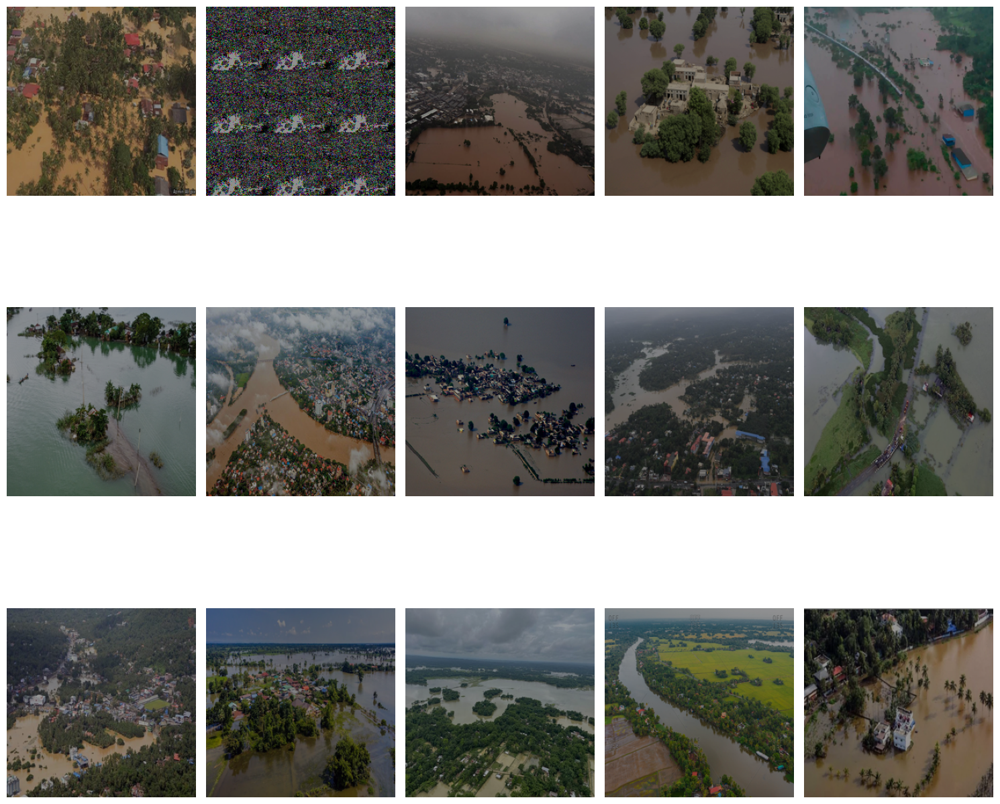

In [ ]:
def create_data(data_dir):
    image_paths = []
    mask_paths = []

    image_dir = os.path.join(data_dir, "Image")
    mask_dir = os.path.join(data_dir, "Mask")

    image_paths = [os.path.join(image_dir, f) for f in os.listdir(image_dir) if f.endswith('.png') or f.endswith('.jpg')]
    mask_paths = [os.path.join(mask_dir, f) for f in os.listdir(mask_dir) if f.endswith('.png') or f.endswith('.jpg')]

    return image_paths, mask_paths


def load_image(image_path, SIZE):
    print(image_path)
    image = Image.open(image_path)
    image = image.resize((SIZE, SIZE))
    image_array = np.array(image) / 255.0

    return image_array


def load_images(image_paths, SIZE, mask=False, trim=None):
    """
    Load and process images from a list of paths, handling masks and optional trimming.
    """
    def process_single_image(path):
        img = load_image(path, SIZE)

        if img.shape != (SIZE, SIZE, 3):
            img = np.resize(img, (SIZE, SIZE, 3))

        if mask:
            img = (img > 0.5).astype(np.uint8)

        return img

    return np.array([process_single_image(path) for i, path in enumerate(image_paths) if not trim or i < trim])



def show_image(image, title=None, cmap=None, alpha=1):
    """
    Display a single image using matplotlib with options for color map and transparency.
    """
    plt.imshow(image, cmap=cmap, alpha=alpha)
    plt.axis('off')
    if title:
        plt.title(title)
    plt.show()


def show_mask(image, mask, cmap=None, alpha=0.4):
    """
    Overlay a mask on an image to visualize segmentation results.
    """
    plt.imshow(image, cmap=None)
    plt.imshow(mask, cmap=cmap, alpha=alpha)
    plt.axis('off')
    plt.show()


def show_images(imgs, msks=None, rows=3, cols=5):
    num_samples = min(rows * cols, len(imgs))
    fig, axs = plt.subplots(rows, cols, figsize=(15, 15))
    axs = axs.ravel()

    for i in range(num_samples):
        axs[i].imshow(imgs[i], cmap=None)
        if msks is not None and i < len(msks):
            axs[i].imshow(msks[i], alpha=0.4, cmap='jet')
        axs[i].axis('off')


    for i in range(num_samples, len(axs)):
        axs[i].axis('off')

    plt.tight_layout()
    plt.show()


SIZE = 256
data_dir = '/content/drive/MyDrive/ML/'
SIZE = 256

image_paths, mask_paths = create_data(data_dir)

images = load_images(image_paths, SIZE)
masks = load_images(mask_paths, SIZE, mask=True)

show_images(images, masks, rows=3, cols=5)

## The Architecture
In addition to U-Net, we are going to utilize Attention Gates.
You probably need to read this paper: https://arxiv.org/pdf/1804.03999v3

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class DiceLoss(nn.Module):
    def __init__(self, smooth=1e-6):
        super(DiceLoss, self).__init__()
        self.smooth = smooth

    def forward(self, pred, target):
        """
        Compute the Dice coefficient loss.
        """
        pred = pred.view(-1)
        target = target.view(-1)

        intersection = (pred * target).sum()
        dice_score = (2.0 * intersection + self.smooth) / (pred.sum() + target.sum() + self.smooth)
        return 1 - dice_score


class JaccardLoss(nn.Module):
    def __init__(self, smooth=1e-6):
        super(JaccardLoss, self).__init__()
        self.smooth = smooth

    def forward(self, pred, target):
        """
        Compute the Jaccard (IoU) loss.
        """
        pred = pred.view(-1)
        target = target.view(-1)

        intersection = (pred * target).sum()
        union = pred.sum() + target.sum() - intersection
        jaccard_score = (intersection + self.smooth) / (union + self.smooth)
        return 1 - jaccard_score


class EncoderBlock(nn.Module):
    def __init__(self, in_channels, out_channels, rate, pooling=True):
        super(EncoderBlock, self).__init__()
        self.conv_layers = nn.Sequential(
            nn.Conv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(),
            nn.Conv2d(in_channels=out_channels, out_channels=out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(),
            nn.Dropout(rate),
        )
        self.pool = nn.MaxPool2d(2) if pooling else None

    def forward(self, X):
        X = self.conv_layers(X)
        if self.pool:
            X = self.pool(X)
        return X



class DecoderBlock(nn.Module):
    def __init__(self, in_channels, filters, rate):
        super(DecoderBlock, self).__init__()
        self.upconv = nn.ConvTranspose2d(in_channels, filters, kernel_size=2, stride=2)
        self.conv_layers = nn.Sequential(
            nn.Conv2d(filters + filters, filters, kernel_size=3, padding=1),
            nn.BatchNorm2d(filters),
            nn.ReLU(),
            nn.Conv2d(filters, filters, kernel_size=3, padding=1),
            nn.BatchNorm2d(filters),
            nn.ReLU(),
            nn.Dropout(rate),
        )

    def forward(self, X, skip_connection):
        X = self.upconv(X)
        X = F.interpolate(X, size=skip_connection.shape[2:], mode="bilinear", align_corners=False)

        X = torch.cat([X, skip_connection], dim=1)

        return self.conv_layers(X)


class AttentionGate(nn.Module):
    def __init__(self, filters, bn):
        super(AttentionGate, self).__init__()
        self.conv1 = nn.Conv2d(filters, filters, kernel_size=1)
        self.conv2 = nn.Conv2d(filters, filters, kernel_size=1)
        self.conv3 = nn.Conv2d(filters, 1, kernel_size=1)
        self.bn = nn.BatchNorm2d(filters) if bn else nn.Identity()

    def forward(self, x, g):
        theta_x = self.conv1(x)
        phi_g = self.conv2(g)
        add = theta_x + phi_g
        add = F.relu(self.bn(add))
        psi = torch.sigmoid(self.conv3(add))
        return x * psi


class UNetModel(nn.Module):
    def __init__(self, in_channels=3, out_channels=1, base_filters=64, rate=0.1):
        super(UNetModel, self).__init__()

        self.enc1 = EncoderBlock(in_channels=3, out_channels=64, rate=0.1, pooling=True)
        self.enc2 = EncoderBlock(in_channels=64, out_channels=128, rate=0.1, pooling=True)
        self.enc3 = EncoderBlock(in_channels=128, out_channels=256, rate=0.1, pooling=True)
        self.enc4 = EncoderBlock(in_channels=256, out_channels=512, rate=0.1, pooling=True)

        self.bottleneck = EncoderBlock(in_channels=512, out_channels=1024, rate=0.1, pooling=False)
        # Decoder blocks
        self.dec4 = DecoderBlock(in_channels=1024, filters=512, rate=0.1)
        self.dec3 = DecoderBlock(in_channels=512, filters=256, rate=0.1)
        self.dec2 = DecoderBlock(in_channels=256, filters=128, rate=0.1)
        self.dec1 = DecoderBlock(in_channels=128, filters=64, rate=0.1)

        # Output layer
        self.out_conv = nn.Conv2d(base_filters, out_channels, kernel_size=1)

        # Losses
        self.dice_loss = DiceLoss()
        self.jaccard_loss = JaccardLoss()

    def forward(self, x):
        # Encoder path
        e1 = self.enc1(x)
        e2 = self.enc2(e1)
        e3 = self.enc3(e2)
        e4 = self.enc4(e3)

        # Bottleneck
        b = self.bottleneck(e4)

        # Decoder path
        d4 = self.dec4(b, e4)
        d3 = self.dec3(d4, e3)
        d2 = self.dec2(d3, e2)
        d1 = self.dec1(d2, e1)

        # Output
        out = torch.sigmoid(self.out_conv(d1))
        return out

    def compute_loss(self, pred, target):
        """
        Calculate the combined segmentation loss using Dice and Jaccard losses.
        """
        dice = self.dice_loss(pred, target)
        jaccard = self.jaccard_loss(pred, target)
        return dice + jaccard


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = UNetModel().to(device)
learning_rate = 0.001
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

from torchsummary import summary
summary(model, input_size=(3, 256, 256))

model.train()

model.eval()

sample_input = torch.randn(1, 3, 256, 256).to(device)
output = model(sample_input)
print("Output shape:", output.shape)


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 256, 256]           1,792
       BatchNorm2d-2         [-1, 64, 256, 256]             128
              ReLU-3         [-1, 64, 256, 256]               0
            Conv2d-4         [-1, 64, 256, 256]          36,928
       BatchNorm2d-5         [-1, 64, 256, 256]             128
              ReLU-6         [-1, 64, 256, 256]               0
           Dropout-7         [-1, 64, 256, 256]               0
         MaxPool2d-8         [-1, 64, 128, 128]               0
      EncoderBlock-9         [-1, 64, 128, 128]               0
           Conv2d-10        [-1, 128, 128, 128]          73,856
      BatchNorm2d-11        [-1, 128, 128, 128]             256
             ReLU-12        [-1, 128, 128, 128]               0
           Conv2d-13        [-1, 128, 128, 128]         147,584
      BatchNorm2d-14        [-1, 128, 1

## Training

Epoch 1/40, Train Loss: 0.6641, Train Acc: 0.7353, Val Loss: 0.6934, Val Acc: 0.5541
Epoch 2/40, Train Loss: 0.6364, Train Acc: 0.7701, Val Loss: 0.8574, Val Acc: 0.3956
Epoch 3/40, Train Loss: 0.6251, Train Acc: 0.7753, Val Loss: 0.7086, Val Acc: 0.6112
Epoch 4/40, Train Loss: 0.6164, Train Acc: 0.7879, Val Loss: 0.6348, Val Acc: 0.7863
Epoch 5/40, Train Loss: 0.6116, Train Acc: 0.7921, Val Loss: 0.6336, Val Acc: 0.7776
Epoch 6/40, Train Loss: 0.6086, Train Acc: 0.7956, Val Loss: 0.6194, Val Acc: 0.7803
Epoch 7/40, Train Loss: 0.6062, Train Acc: 0.7979, Val Loss: 0.6190, Val Acc: 0.7741
Epoch 8/40, Train Loss: 0.6054, Train Acc: 0.7954, Val Loss: 0.6233, Val Acc: 0.7535
Epoch 9/40, Train Loss: 0.6026, Train Acc: 0.8023, Val Loss: 0.6161, Val Acc: 0.7967
Epoch 10/40, Train Loss: 0.6053, Train Acc: 0.7975, Val Loss: 0.6211, Val Acc: 0.7901
Epoch 11/40, Train Loss: 0.6001, Train Acc: 0.8070, Val Loss: 0.6220, Val Acc: 0.7908
Epoch 12/40, Train Loss: 0.5959, Train Acc: 0.8130, Val Loss: 0

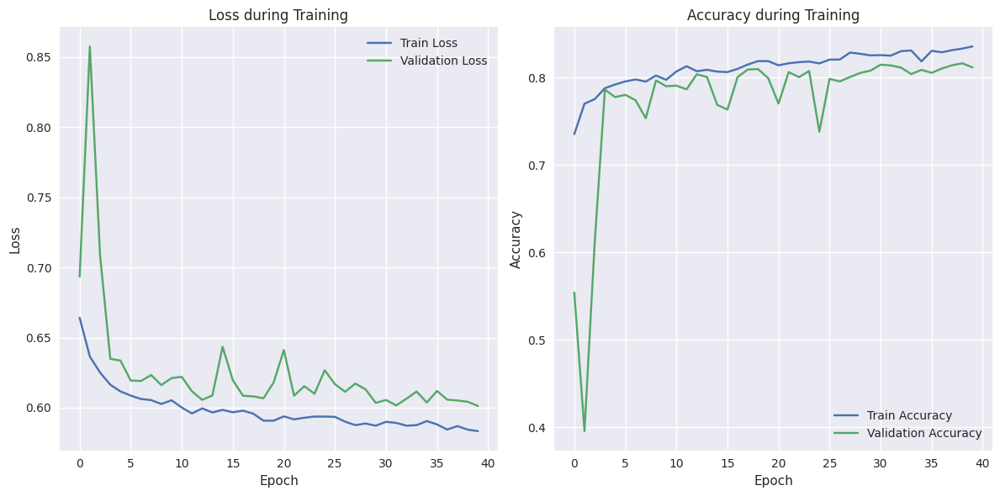

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split
from torchvision import transforms
import numpy as np
import os
from PIL import Image
import matplotlib.pyplot as plt

class SegmentationDataset(Dataset):
    def __init__(self, image_paths, mask_paths, transform=None):
        """
        Custom Dataset for loading images and masks.
        """
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        """
        Fetches image and mask at index `idx`.
        """
        image = load_image(self.image_paths[idx], SIZE)
        mask = load_image(self.mask_paths[idx], SIZE)

        if len(image.shape) == 2:
            image = np.stack([image] * 3, axis=-1)
        elif image.shape[-1] == 4:
            image = image[:, :, :3]

        if len(mask.shape) == 3:
            mask = mask[:, :, 0]


        if self.transform:
            image = self.transform(image)
            mask = self.transform(mask)
        else:
            image = torch.tensor(image.transpose((2, 0, 1)), dtype=torch.float32)
            mask = torch.tensor(mask, dtype=torch.float32).unsqueeze(0)

        return image, mask


SIZE = 256


data_dir = "/content/drive/MyDrive/ML/"
image_paths, mask_paths = create_data(data_dir)

train_image_paths, val_image_paths, train_mask_paths, val_mask_paths = train_test_split(
    image_paths, mask_paths, test_size=0.2, random_state=42
)

train_dataset = SegmentationDataset(train_image_paths, train_mask_paths, transform=transforms.ToTensor())
val_dataset = SegmentationDataset(val_image_paths, val_mask_paths, transform=transforms.ToTensor())

train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False)


model = UNetModel()
device = 'cuda' if torch.cuda.is_available() else 'cpu'
model = model.to(device)


criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)


num_epochs = 40
train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []


for epoch in range(num_epochs):
    model.train()
    train_loss = 0
    train_correct = 0
    train_total = 0

    for batch_idx, (images, masks) in enumerate(train_loader):
        images, masks = images.float().to(device), masks.float().to(device)

        outputs = model(images)


        if outputs.size() != masks.size():
            outputs = F.interpolate(outputs, size=masks.size()[2:], mode='bilinear', align_corners=False)

        loss = criterion(outputs, masks)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_loss += loss.item()

        preds = (outputs > 0.5).float()
        train_correct += (preds == masks).sum().item()
        train_total += masks.numel()

    train_losses.append(train_loss / len(train_loader))
    train_accuracies.append(train_correct / train_total)


    model.eval()
    val_loss = 0
    val_correct = 0
    val_total = 0

    with torch.no_grad():
        for images, masks in val_loader:
            images, masks = images.float().to(device), masks.float().to(device)

            outputs = model(images)


            if outputs.size() != masks.size():
                outputs = F.interpolate(outputs, size=masks.size()[2:], mode='bilinear', align_corners=False)

            loss = criterion(outputs, masks)
            val_loss += loss.item()


            preds = (outputs > 0.5).float()
            val_correct += (preds == masks).sum().item()
            val_total += masks.numel()

    val_losses.append(val_loss / len(val_loader))
    val_accuracies.append(val_correct / val_total)

    print(f"Epoch {epoch + 1}/{num_epochs}, "
          f"Train Loss: {train_losses[-1]:.4f}, Train Acc: {train_accuracies[-1]:.4f}, "
          f"Val Loss: {val_losses[-1]:.4f}, Val Acc: {val_accuracies[-1]:.4f}")


torch.save(model.state_dict(), "unet_segmentation_model.pth")
print("Model saved.")


plt.figure(figsize=(12, 6))


plt.subplot(1, 2, 1)
plt.plot(train_losses, label='Train Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('Loss during Training')


plt.subplot(1, 2, 2)
plt.plot(train_accuracies, label='Train Accuracy')
plt.plot(val_accuracies, label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Accuracy during Training')

plt.tight_layout()
plt.show()


## Plottings

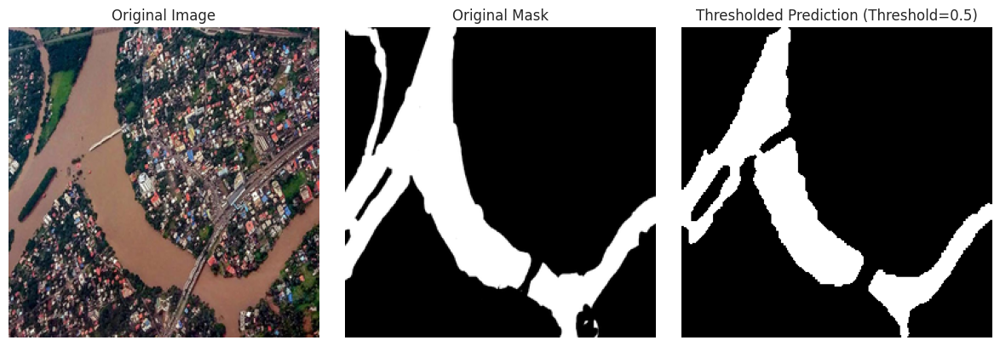

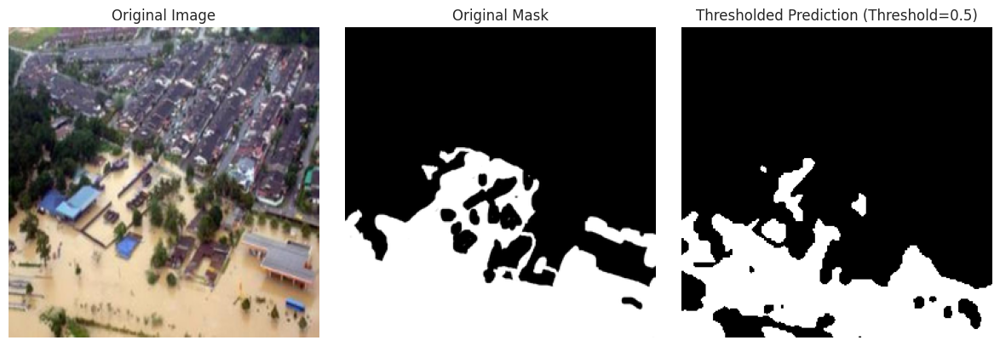

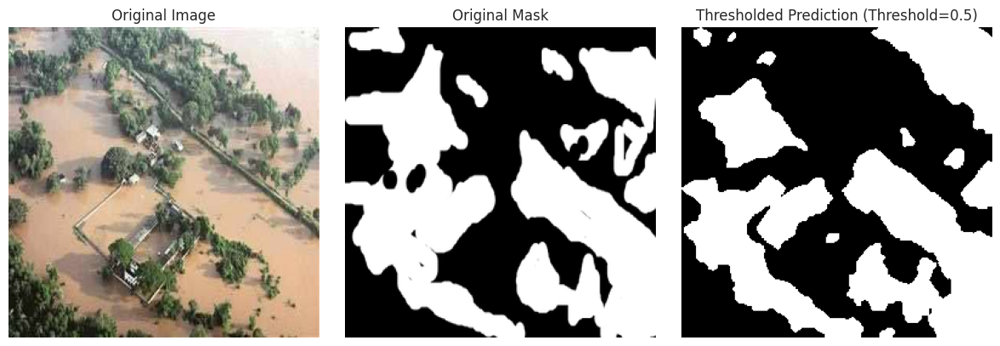

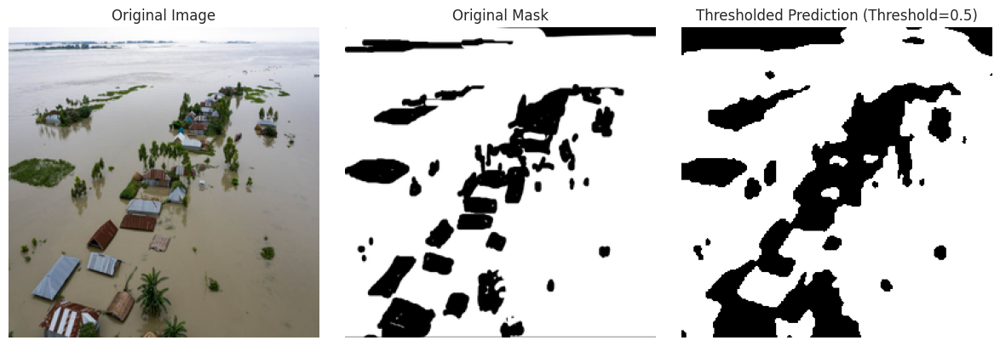

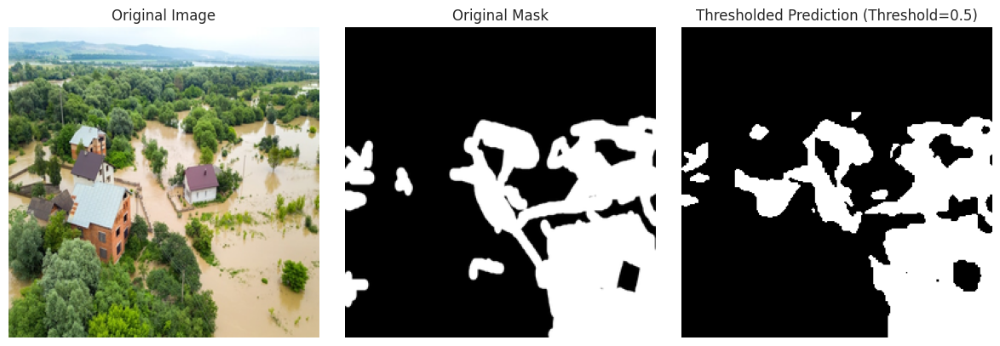

...

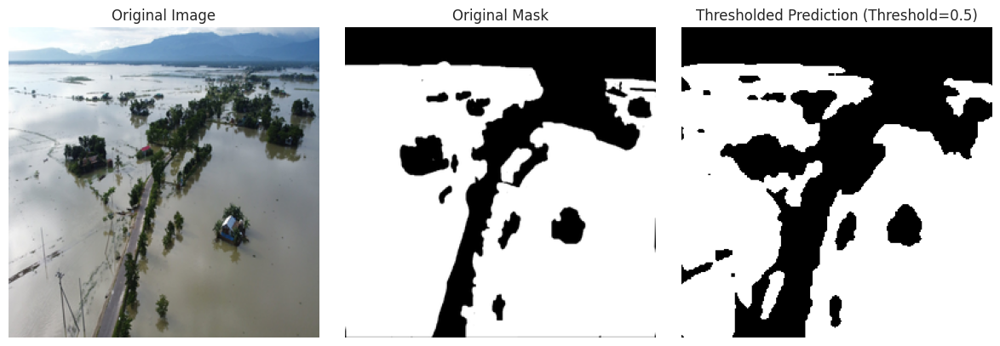

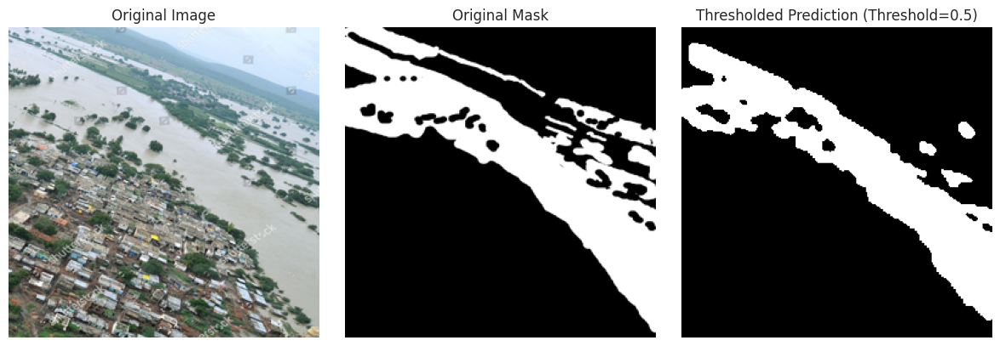

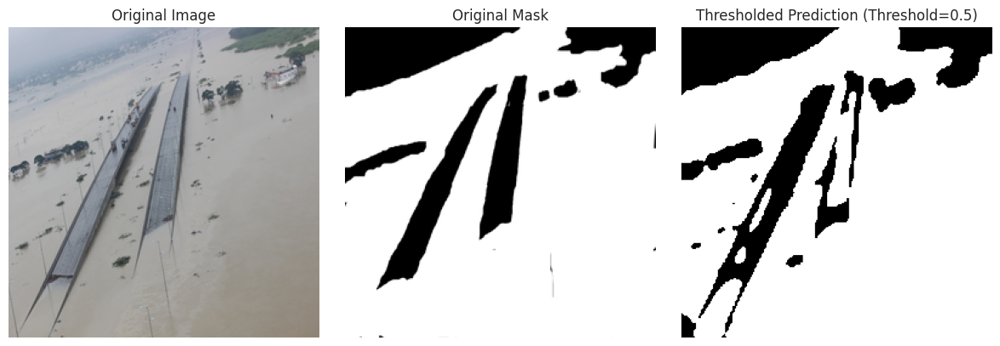

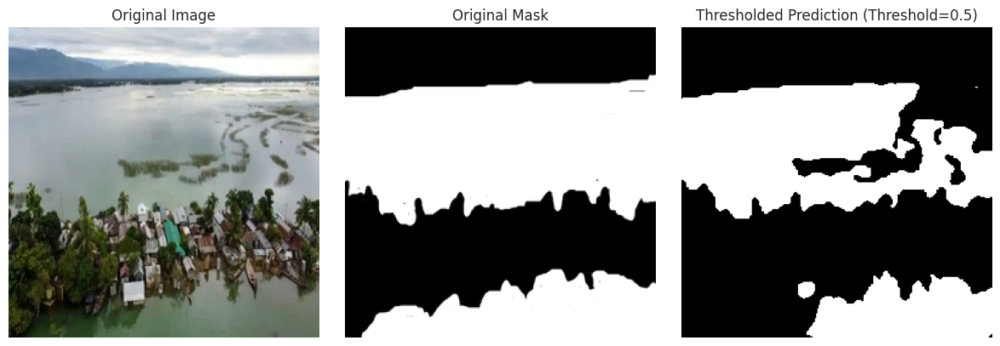

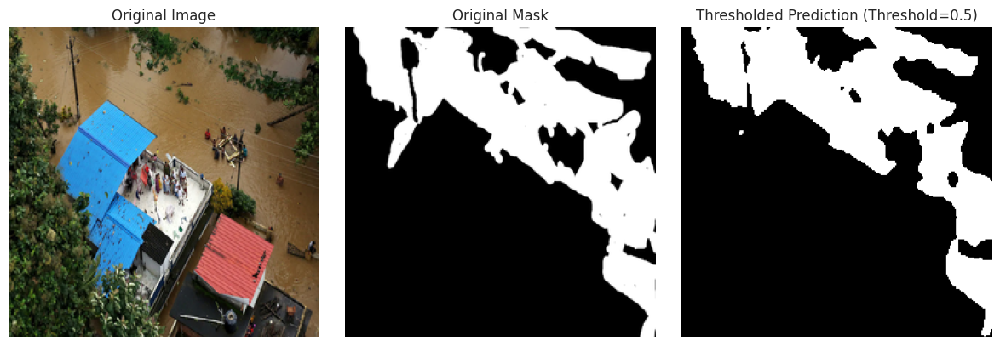

In [ ]:
import matplotlib.pyplot as plt


def plot_predictions(images, masks, preds, threshold=0.5):
    """
    Plots the original mask, predicted mask, and thresholded mask for comparison.
    """
    for i in range(len(images)):
        image = images[i].cpu().numpy().transpose((1, 2, 0))
        original_mask = masks[i].cpu().numpy().squeeze()
        predicted_mask = preds[i].cpu().numpy().squeeze()
        thresholded_mask = (predicted_mask > threshold).astype(np.float32)


        plt.figure(figsize=(12, 4))


        plt.subplot(1, 3, 1)
        plt.imshow(image)
        plt.title('Original Image')
        plt.axis('off')


        plt.subplot(1, 3, 2)
        plt.imshow(original_mask, cmap='gray')
        plt.title('Original Mask')
        plt.axis('off')


        plt.subplot(1, 3, 3)
        plt.imshow(thresholded_mask, cmap='gray')
        plt.title(f'Thresholded Prediction (Threshold={threshold})')
        plt.axis('off')

        plt.tight_layout()
        plt.show()


model.eval()
with torch.no_grad():
    for images, masks in val_loader:
        images, masks = images.float().to(device), masks.float().to(device)

        outputs = model(images)


        if outputs.size() != masks.size():
            outputs = F.interpolate(outputs, size=masks.size()[2:], mode='bilinear', align_corners=False)

        preds = (outputs > 0.5).float()


        plot_predictions(images, masks, preds, threshold=0.5)
        break


1. **Comparison with Conventional Loss Functions**:
    - How do Dice and Jaccard Losses differ from Cross-Entropy or Mean Squared Error, particularly in terms of sensitivity to class imbalances? **answer:** Dice and Jaccard losses are designed for segmentation tasks and are particularly effective at handling class imbalances because they focus on measuring the overlap between predicted and true positive regions. Dice loss emphasizes the accuracy of object boundaries, giving more weight to smaller foreground areas, while Jaccard loss (IoU) measures the intersection over union and is sensitive to misclassifications in the foreground class. In contrast, Cross-Entropy loss treats each pixel independently and can be less sensitive to class imbalances, especially when the background class dominates. Similarly, Mean Squared Error (MSE) evaluates pixel-wise differences without considering class-specific areas, making it less effective for imbalanced datasets. Overall, Dice and Jaccard losses provide more meaningful evaluation in segmentation tasks by focusing on the spatial overlap of foreground regions, making them better suited for imbalanced data compared to Cross-Entropy or MSE.
    - What advantages do these losses offer in capturing the spatial overlap between the predicted and true segmentations?

2. **Interpretation of Loss Values**:
    - Discuss what high or low loss scores reveal about the state and effectiveness of your segmentation model. **answer:** High or low loss scores provide important insights into the performance and effectiveness of a segmentation model. A low loss indicates that the model is effectively predicting the segmentation, with the predicted output closely matching the ground truth. This suggests that the model has learned to capture the essential features and patterns in the data. On the other hand, a high loss points to poor model performance, indicating that the model's predictions significantly deviate from the ground truth, often due to underfitting, insufficient training, or poor generalization. In the context of segmentation models, loss scores also help identify issues like class imbalances, where the model might struggle with foreground regions if the background class dominates. Monitoring loss trends over time can also help assess if the model is converging or if it needs further adjustments in terms of architecture, learning rate, or data augmentation.

Evaluate the role of the attention mechanism in optimizing segmentation accuracy in cluttered environments. How does it refine the segmentation process? **answer:** The attention mechanism enhances segmentation accuracy in cluttered environments by allowing the model to focus on relevant regions while ignoring less important areas. This selective focus helps the model better distinguish fine details, such as object boundaries, in complex scenes with overlapping or occluded objects. By assigning higher weights to important features, the attention mechanism reduces the impact of background noise and distractions, enabling the model to capture spatial dependencies more effectively. As a result, it improves segmentation precision, especially in environments with high visual complexity.

What is the importance of skip connections in U-Net, and how do they enhance the accuracy of segmentation tasks? **answer:** Skip connections in U-Net are crucial for preserving high-resolution spatial information that might be lost during the downsampling (encoding) process. By connecting corresponding layers from the encoder to the decoder, they allow the network to retrieve detailed features from earlier layers and combine them with upsampled features during the decoding process. This helps to retain fine-grained details, like object boundaries, which are critical for accurate segmentation. As a result, skip connections enable the model to produce more precise and context-aware segmentation maps, especially in tasks with complex structures or boundaries.

Explain the difference between the predicted and processed mask above. **answer:** The predicted mask refers to the output generated by the segmentation model after processing the input image. It represents the model’s best estimate of the target segmentation, with pixel values typically ranging from 0 to 1, representing the probability of a pixel belonging to the object of interest.

The processed mask, on the other hand, is the result of applying post-processing techniques to the predicted mask, such as thresholding or smoothing. Post-processing is often used to refine the predicted mask, turning it into a cleaner, binary mask (usually 0 or 1) by removing noise or small irrelevant regions. Thresholding, for example, assigns a value of 1 to pixels with a probability higher than a certain threshold (e.g., 0.5) and 0 to the others.